# Compare tools for image de-duplication

## Preparation

### Install Python packages

In [ ]:
%pip install -q imagededup fastdup cleanvision
#<restarted the runtime as instructed>

### Fetch data

In [ ]:
%cd /content
!wget https://github.com/woctezuma/steam-DINO/releases/download/input/resized_vertical_steam_banners_v2.tar.gz
!tar xf resized_vertical_steam_banners_v2.tar.gz

In [ ]:
work_dir = '/content/sample_data'
img_dir = '/content/resized_vertical_steam_banners'

%rm /content/sample_data/atrain_*

## imagededup

Reference: https://github.com/idealo/imagededup

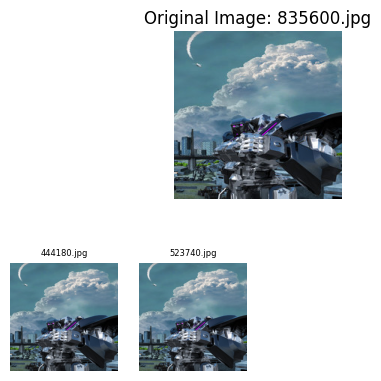

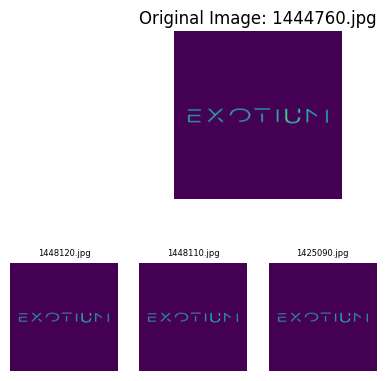

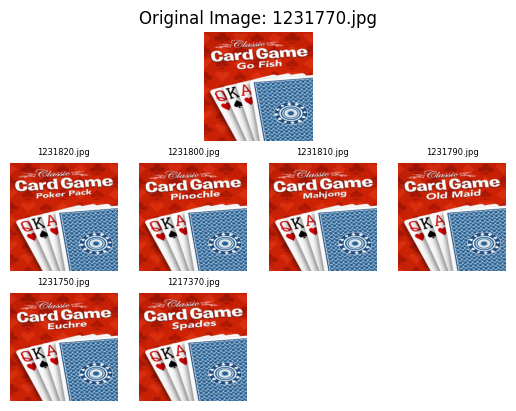

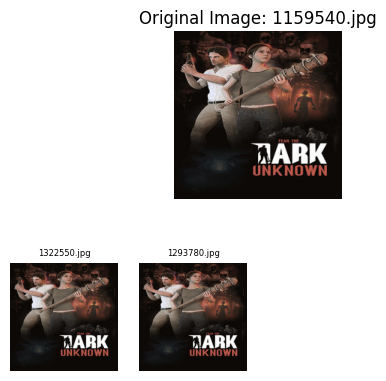

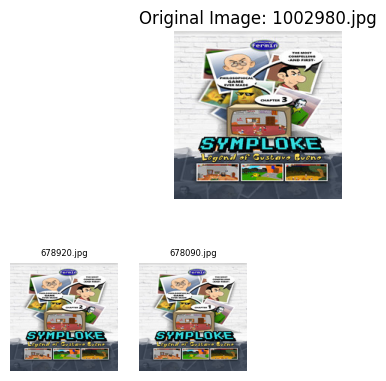

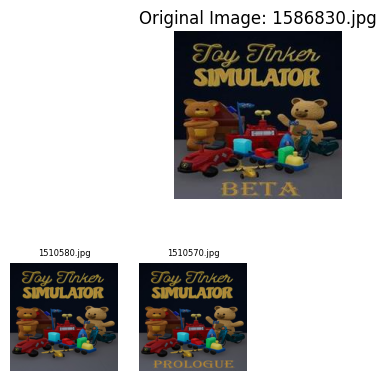

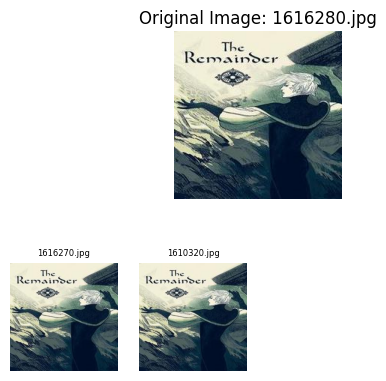

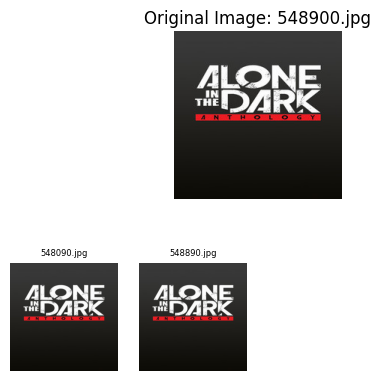

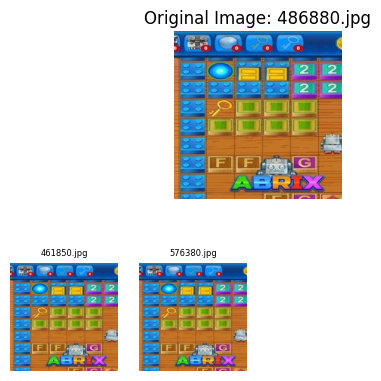

In [ ]:
import json

from imagededup.methods import PHash
from imagededup.utils import plot_duplicates

phasher = PHash()

fname = 'encodings.json'
try:
  with open(fname, 'r') as f:
    encodings = json.load(f)
except FileNotFoundError:
  encodings = phasher.encode_images(img_dir)
  with open(fname, 'w') as f:
    json.dump(encodings, f)

fname = 'duplicates.json'
try:
  with open(fname, 'r') as f:
    duplicates = json.load(f)
except FileNotFoundError:  
  duplicates = phasher.find_duplicates(encoding_map=encodings, max_distance_threshold=0)
  with open(fname, 'w') as f:
    json.dump(duplicates, f)

display_threshold = 1
seen = []
for fname, matches in duplicates.items():
  if fname not in seen:
    if len(matches) > 0:
      seen += matches
    if len(matches) > display_threshold:
      plot_duplicates(img_dir, duplicate_map=duplicates, filename=fname)

## fastdup

Reference: https://github.com/visual-layer/fastdup

In [ ]:
import fastdup

fd = fastdup.create(work_dir, img_dir)
fd.run(nearest_neighbors_k=1, cc_threshold=0.96)

In [ ]:
!tar czf fastdup.tar.gz /content/sample_data/
!tar czvf atrain.tar.gz /content/sample_data/atrain_*

100%|██████████| 20/20 [00:00<00:00, 41.31it/s]


Stored similarity visual view in  /content/sample_data/galleries/duplicates.html



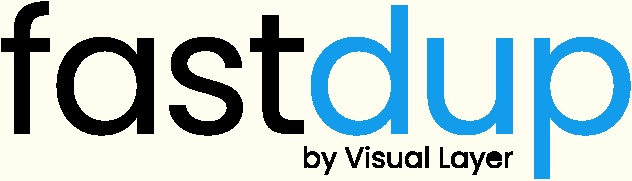
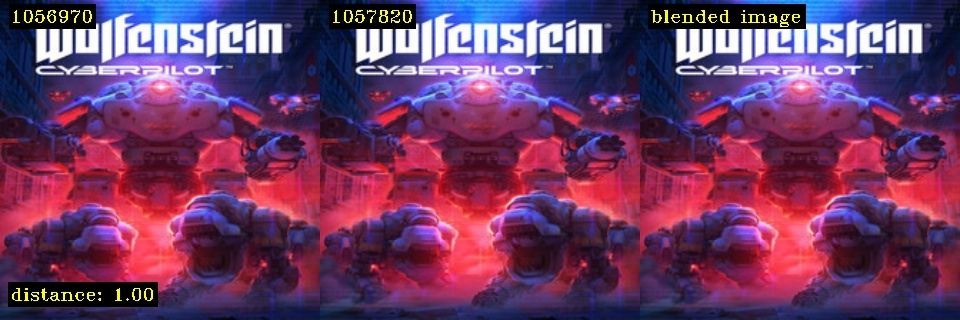
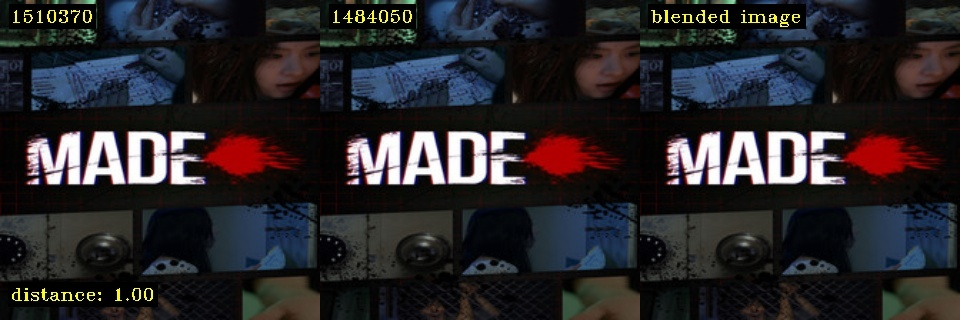
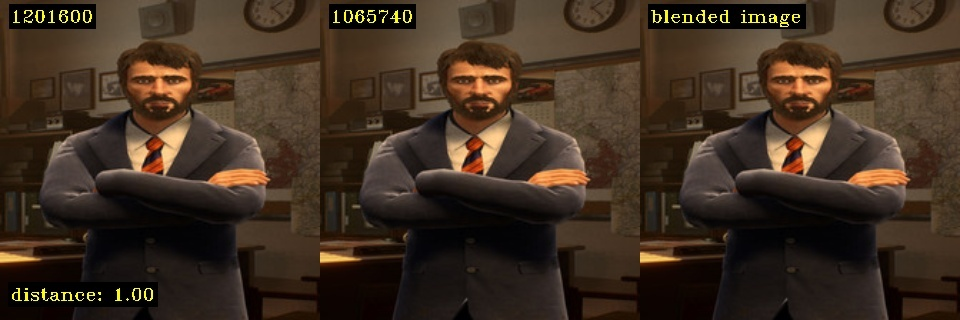
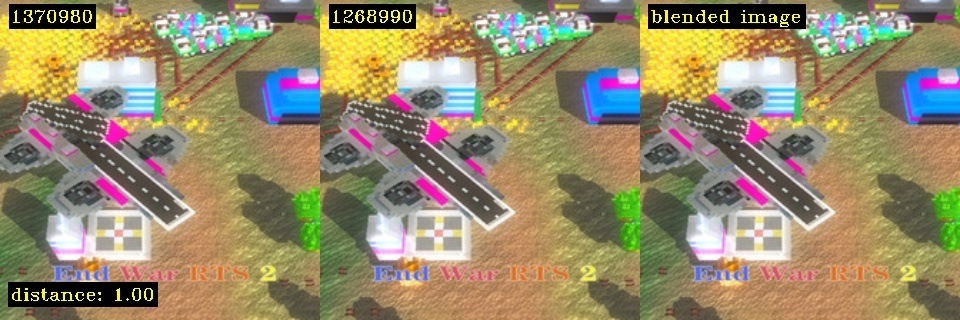
...
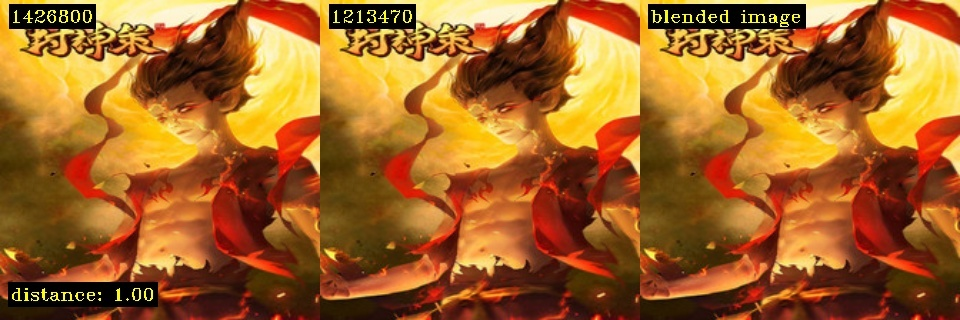
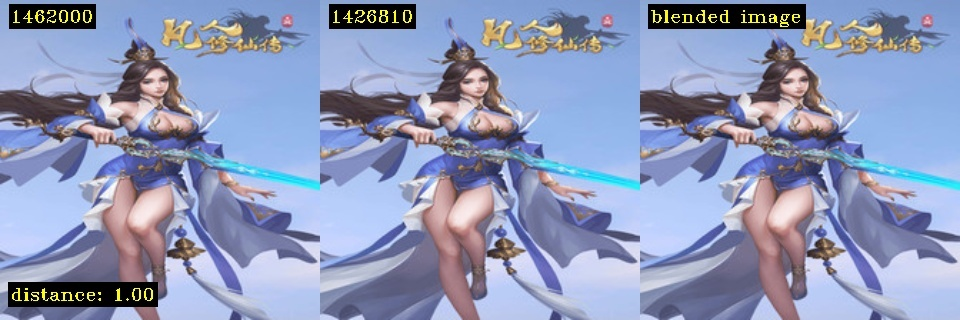
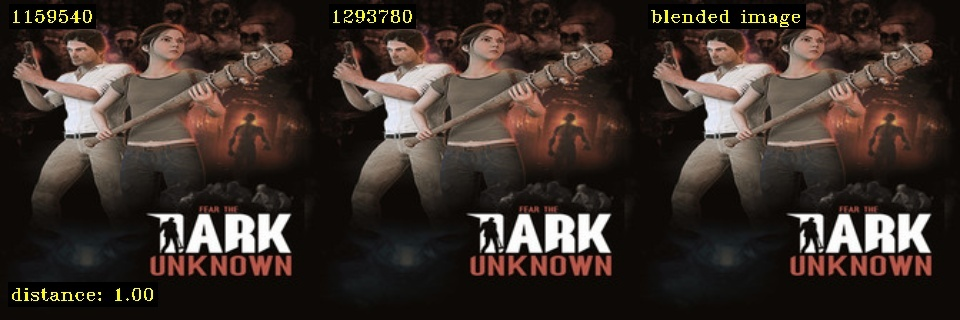
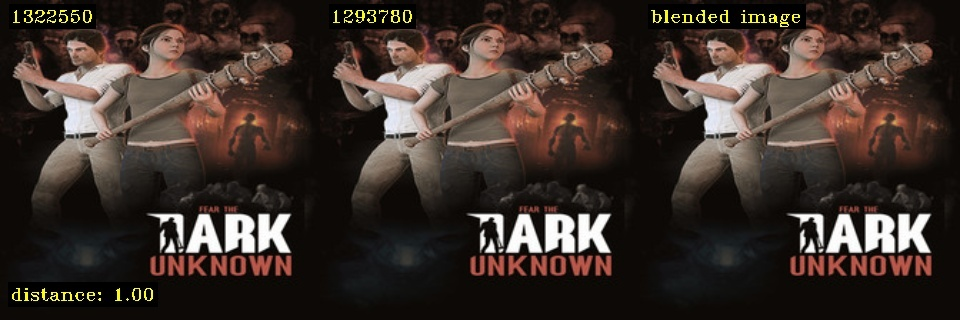
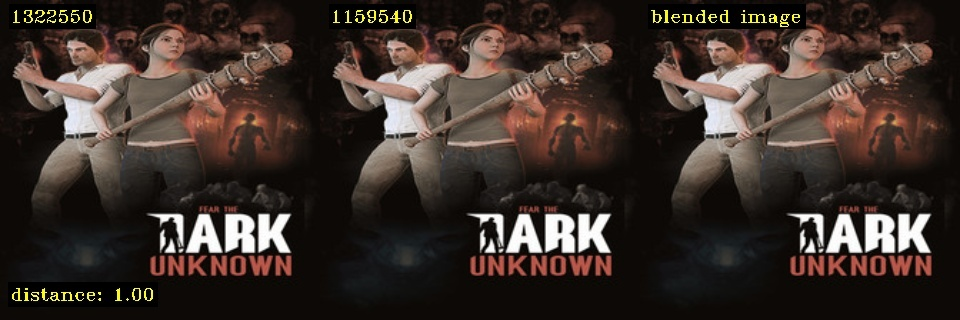

In [ ]:
fd.vis.duplicates_gallery()    # create a visual gallery of found duplicates

100%|██████████| 20/20 [00:00<00:00, 12267.63it/s]

Stored outliers visual view in  /content/sample_data/galleries/outliers.html



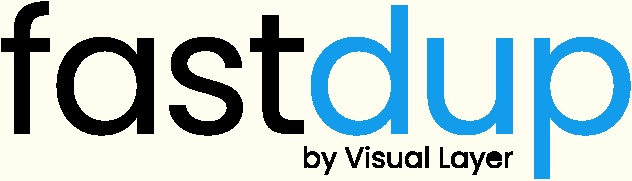
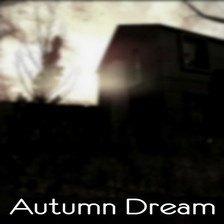
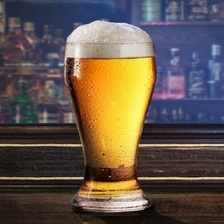
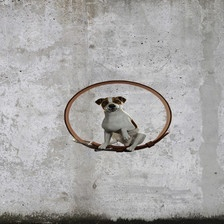
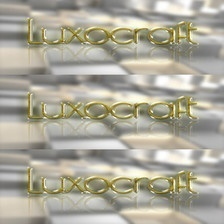
...
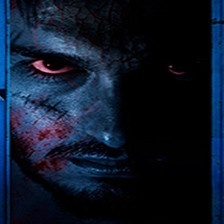
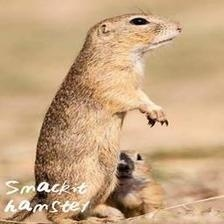
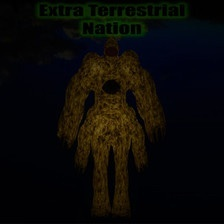
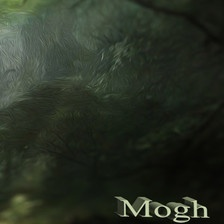
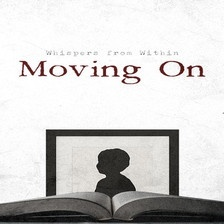

In [ ]:
fd.vis.outliers_gallery()      # create a visual gallery of anomalies

100%|██████████| 20/20 [00:00<00:00, 47.23it/s]


Finished OK. Components are stored as image files /content/sample_data/galleries/components_[index].jpg
Stored components visual view in  /content/sample_data/galleries/components.html
Execution time in seconds 7.4



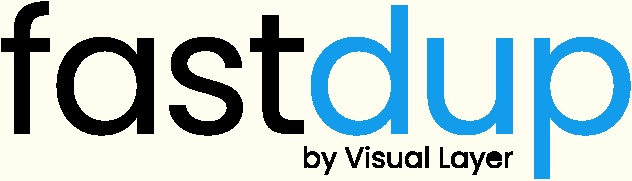
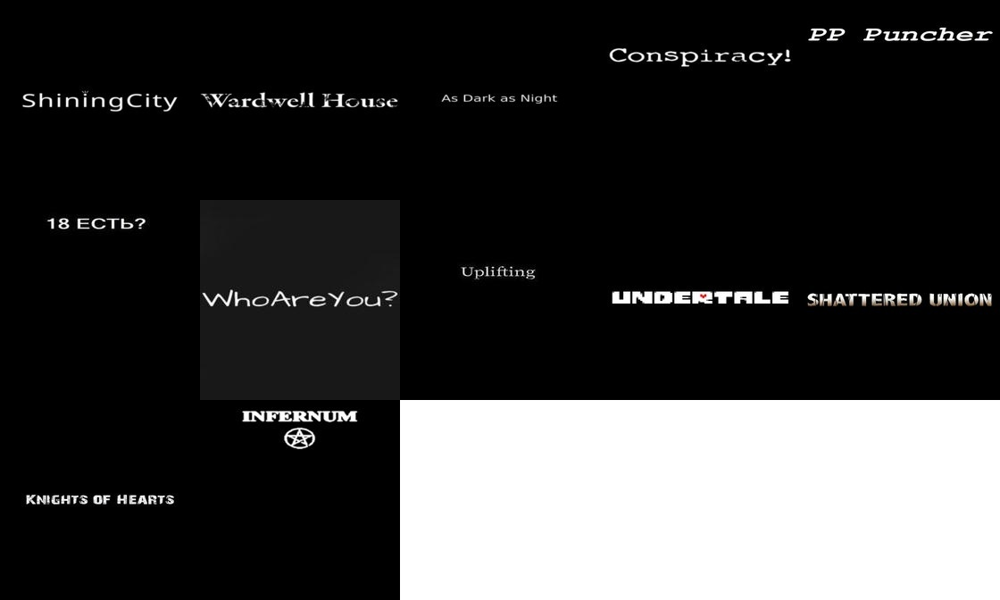
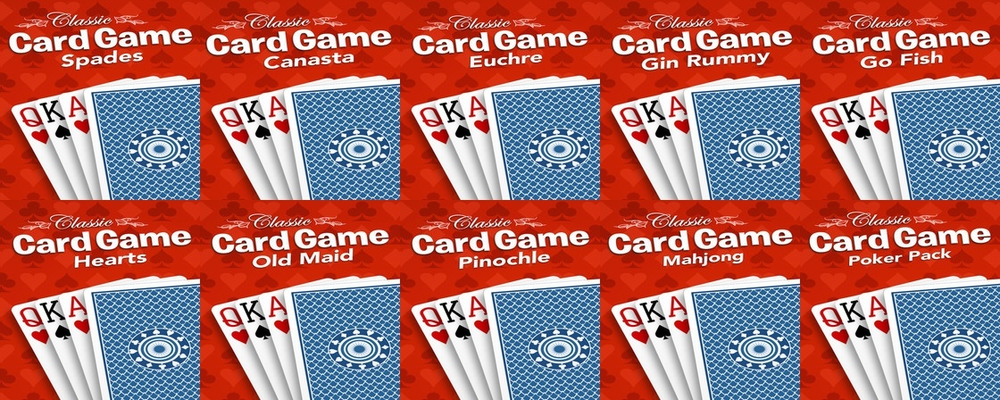
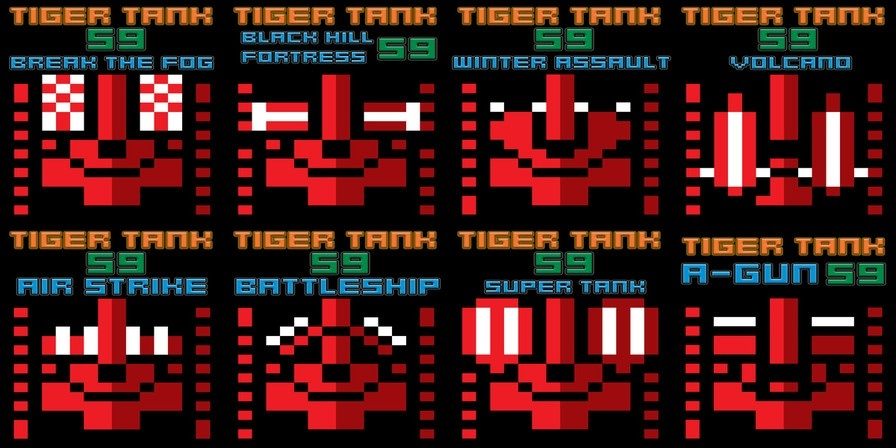
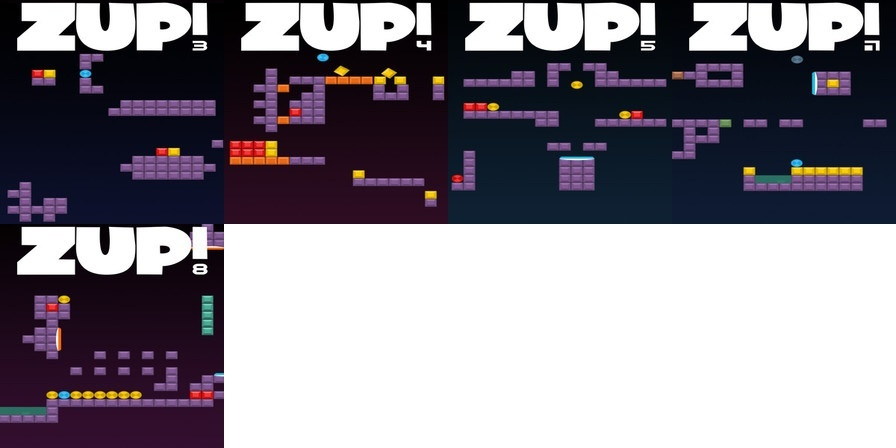
...
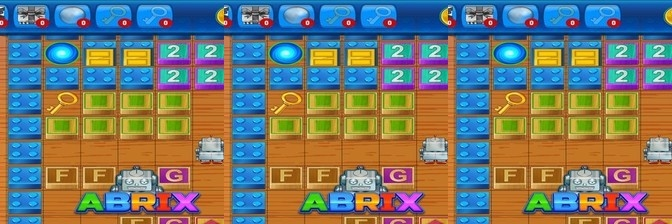
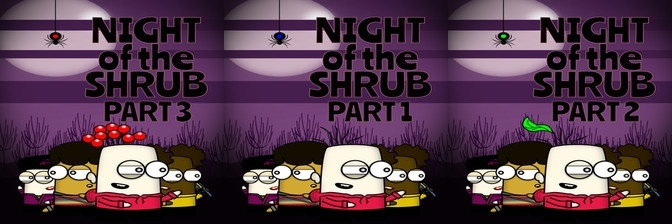
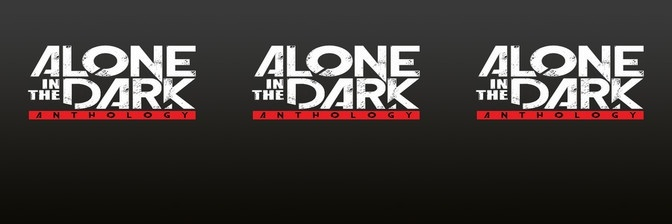
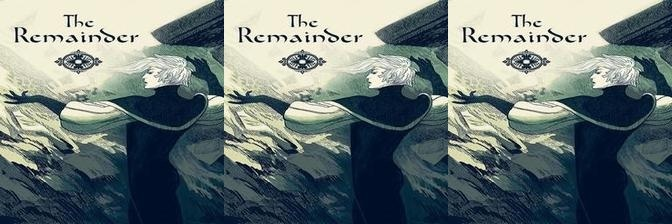
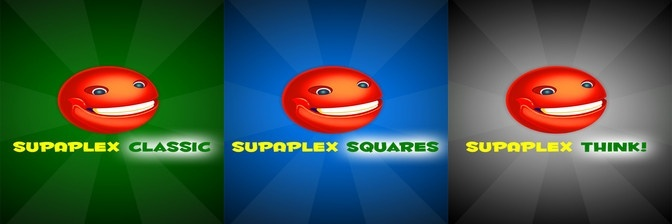

In [ ]:
fd.vis.component_gallery()     # create a visualization of connected components

100%|██████████| 20/20 [00:00<00:00, 380.80it/s]

Stored mean visual view in  /content/sample_data/galleries/mean.html



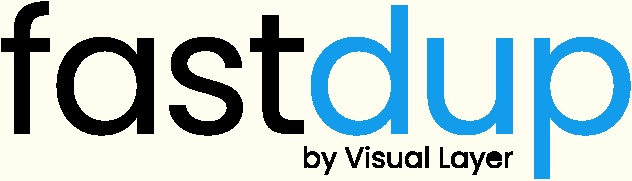
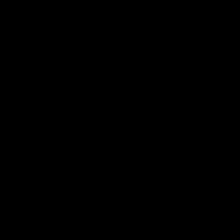
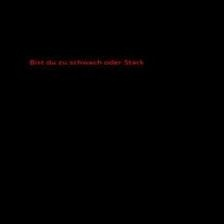
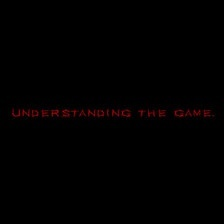
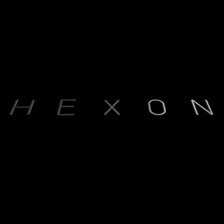
...
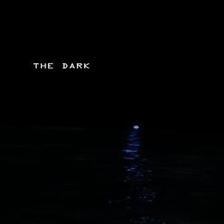
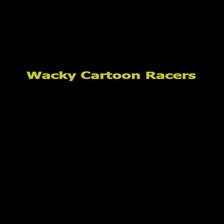
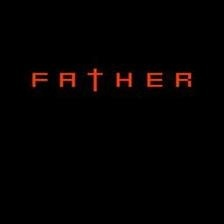
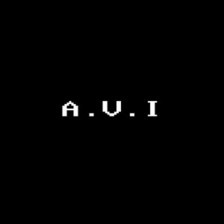
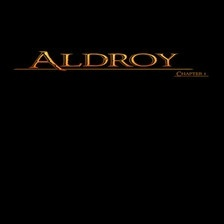

In [ ]:
fd.vis.stats_gallery()         # create a visualization of images statistics (for example blur)

100%|██████████| 20/20 [00:00<00:00, 55.36it/s]


Stored similar images visual view in  /content/sample_data/galleries/similarity.html



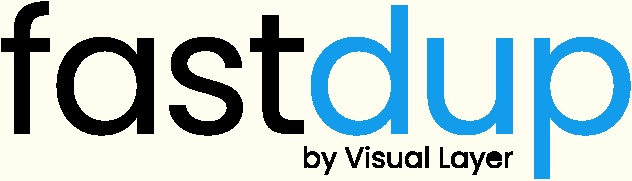
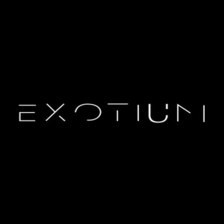
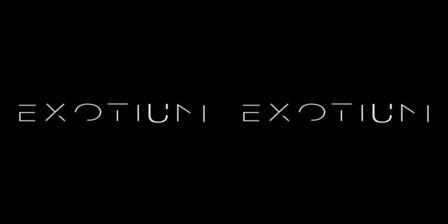
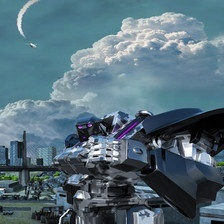
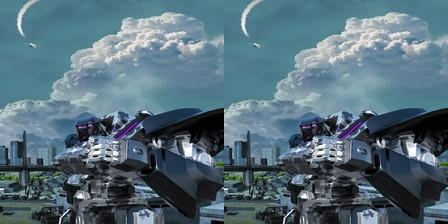
...
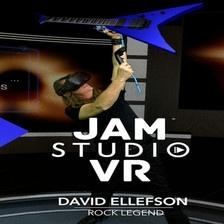
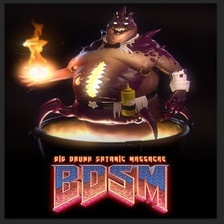
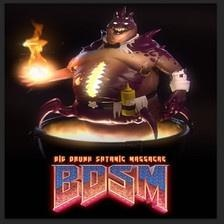
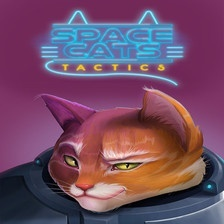
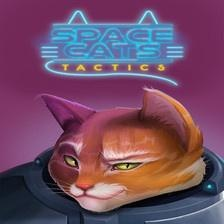

,from,to,distance
542,resized_vertical_steam_banners/1448110.jpg,"[resized_vertical_steam_banners/1444760.jpg, resized_vertical_steam_banners/1425090.jpg]","[1.0, 1.0]"
849,resized_vertical_steam_banners/523740.jpg,"[resized_vertical_steam_banners/835600.jpg, resized_vertical_steam_banners/444180.jpg]","[1.0, 1.0]"
386,resized_vertical_steam_banners/1322550.jpg,"[resized_vertical_steam_banners/1159540.jpg, resized_vertical_steam_banners/1293780.jpg]","[1.0, 1.0]"
833,resized_vertical_steam_banners/461850.jpg,"[resized_vertical_steam_banners/486880.jpg, resized_vertical_steam_banners/576380.jpg]","[1.0, 1.0]"
722,resized_vertical_steam_banners/1616280.jpg,"[resized_vertical_steam_banners/1616270.jpg, resized_vertical_steam_banners/1610320.jpg]","[1.0, 1.0]"
...,...,...,...
989,resized_vertical_steam_banners/844160.jpg,[resized_vertical_steam_banners/983280.jpg],[0.900195]
752,resized_vertical_steam_banners/252690.jpg,[resized_vertical_steam_banners/383670.jpg],[0.900138]
145,resized_vertical_steam_banners/1150790.jpg,[resized_vertical_steam_banners/1129680.jpg],[0.900065]
458,resized_vertical_steam_banners/1381820.jpg,[resized_vertical_steam_banners/1223850.jpg],[0.900027]


In [ ]:
fd.vis.similarity_gallery()    # create a gallery of similar images

## cleanvision
Reference: https://github.com/cleanlab/cleanvision

Reading images from /content/resized_vertical_steam_banners
Checking for dark, light, odd_aspect_ratio, low_information, exact_duplicates, near_duplicates, blurry, grayscale images ...


100%|██████████| 35704/35704 [01:44<00:00, 340.24it/s]


Issue checks completed. To see a detailed report of issues found, use imagelab.report().
Issues found in order of severity in the dataset

|    | issue_type       |   num_images |
|---:|:-----------------|-------------:|
|  0 | grayscale        |          446 |
|  1 | low_information  |          360 |
|  2 | dark             |          199 |
|  3 | exact_duplicates |          127 |
|  4 | near_duplicates  |           93 |
|  5 | blurry           |           33 |
|  6 | light            |           15 | 


Top 4 examples with grayscale issue in the dataset.


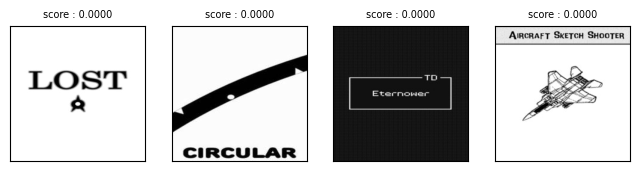


Top 4 examples with low_information issue in the dataset.


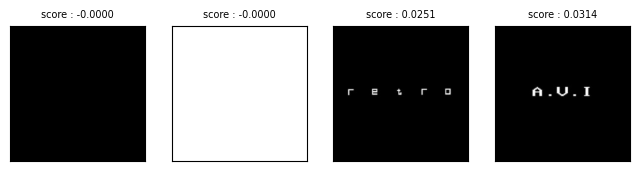


Top 4 examples with dark issue in the dataset.


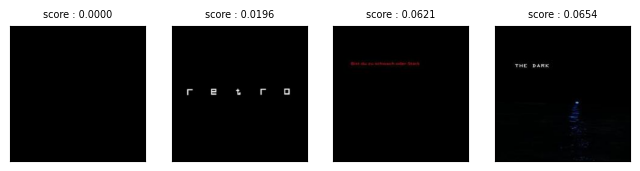


Top 4 sets of images with exact_duplicates issue
Set: 0


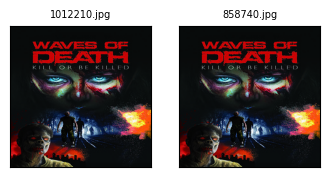

Set: 1


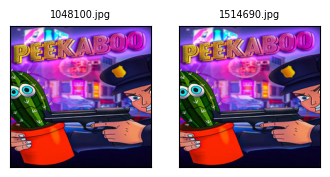

Set: 2


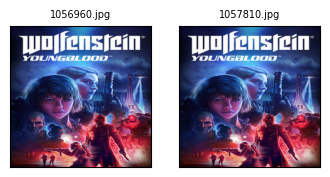

Set: 3


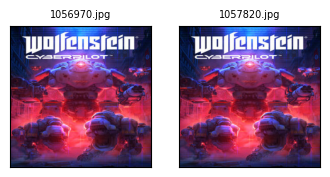


Top 4 sets of images with near_duplicates issue
Set: 0


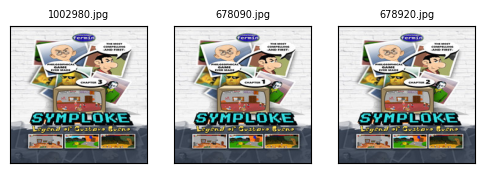

Set: 1


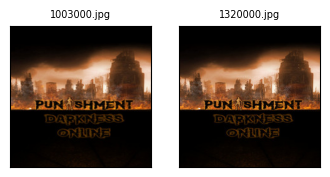

Set: 2


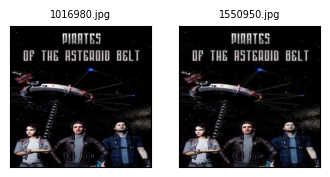

Set: 3


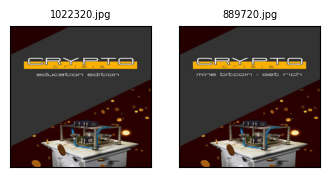


Top 4 examples with blurry issue in the dataset.


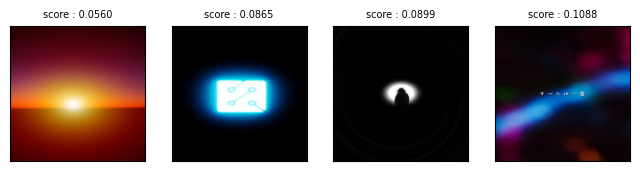


Top 4 examples with light issue in the dataset.


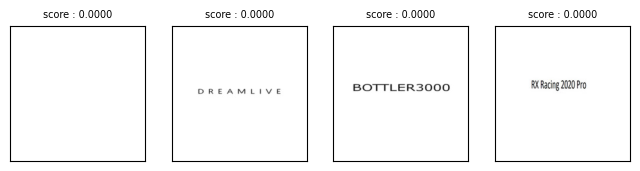

In [4]:
from cleanvision.imagelab import Imagelab

imagelab = Imagelab(data_path=img_dir)

imagelab.find_issues()

imagelab.report()

### Indivudal reports

In [24]:
num_images = 12

Issues found in order of severity in the dataset

|    | issue_type   |   num_images |
|---:|:-------------|-------------:|
|  0 | grayscale    |          446 | 


Top 12 examples with grayscale issue in the dataset.


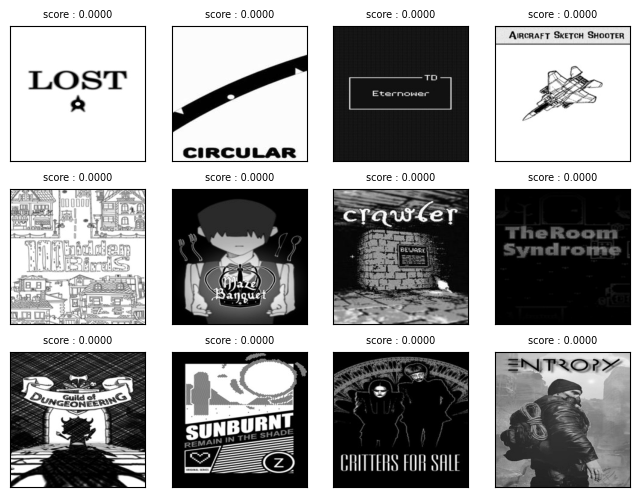

In [25]:
imagelab.report(["grayscale"], num_images=num_images)

Issues found in order of severity in the dataset

|    | issue_type      |   num_images |
|---:|:----------------|-------------:|
|  1 | low_information |          360 | 


Top 12 examples with low_information issue in the dataset.


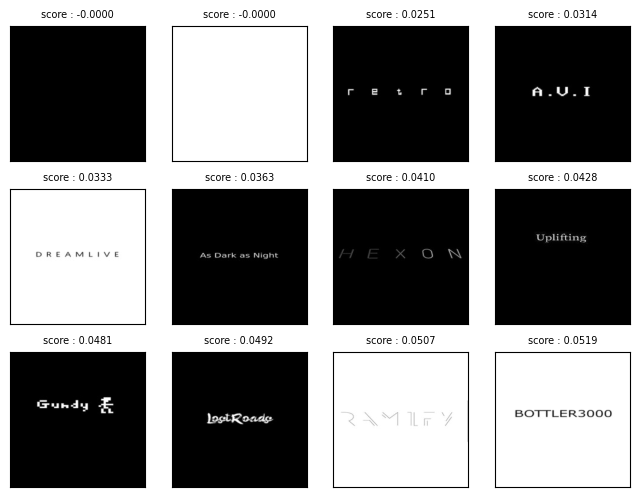

In [26]:
imagelab.report(["low_information"], num_images=num_images)

Issues found in order of severity in the dataset

|    | issue_type   |   num_images |
|---:|:-------------|-------------:|
|  2 | dark         |          199 | 


Top 12 examples with dark issue in the dataset.


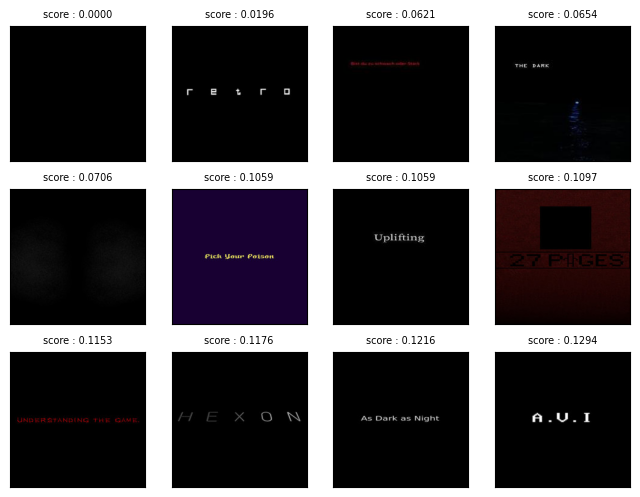

In [27]:
imagelab.report(["dark"], num_images=num_images)

Issues found in order of severity in the dataset

|    | issue_type       |   num_images |
|---:|:-----------------|-------------:|
|  3 | exact_duplicates |          127 | 


Top 12 sets of images with exact_duplicates issue
Set: 0


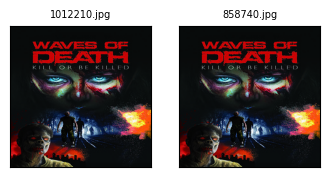

Set: 1


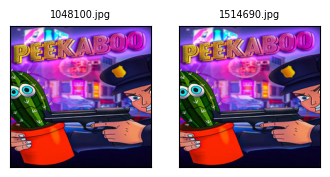

Set: 2


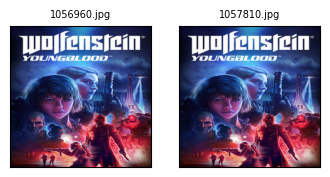

Set: 3


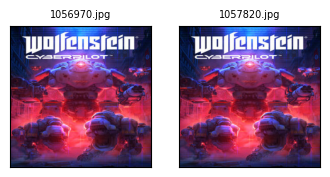

Set: 4


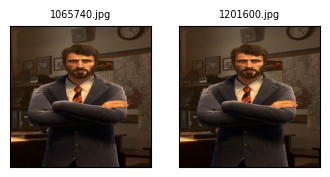

Set: 5


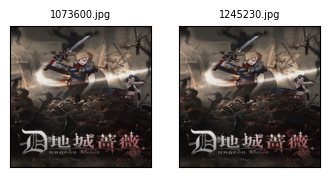

Set: 6


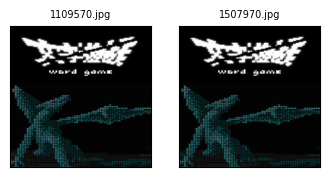

Set: 7


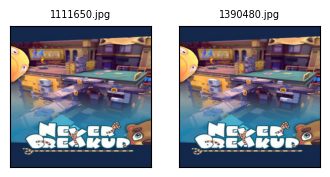

Set: 8


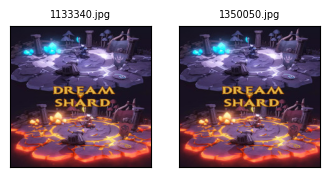

Set: 9


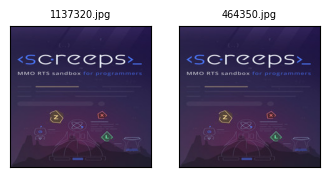

Set: 10


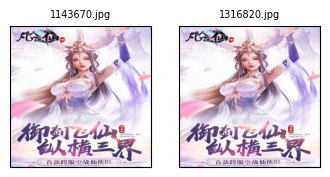

Set: 11


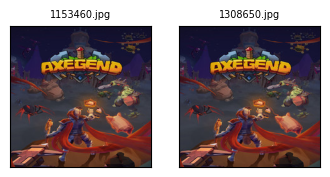

In [28]:
imagelab.report(["exact_duplicates"], num_images=num_images)

Issues found in order of severity in the dataset

|    | issue_type      |   num_images |
|---:|:----------------|-------------:|
|  4 | near_duplicates |           93 | 


Top 12 sets of images with near_duplicates issue
Set: 0


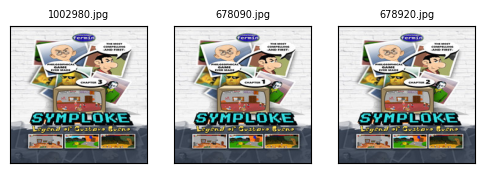

Set: 1


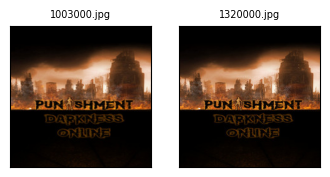

Set: 2


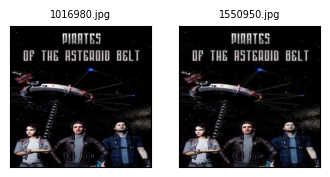

Set: 3


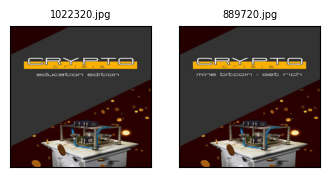

Set: 4


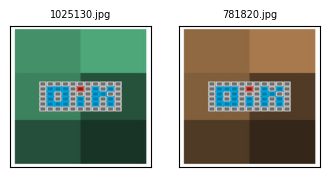

Set: 5


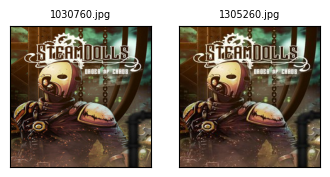

Set: 6


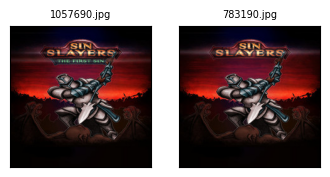

Set: 7


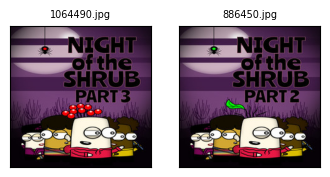

Set: 8


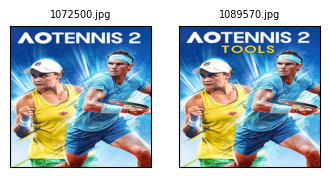

Set: 9


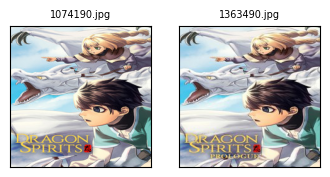

Set: 10


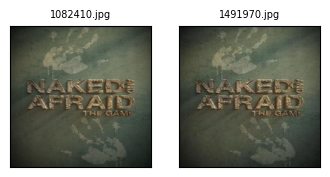

Set: 11


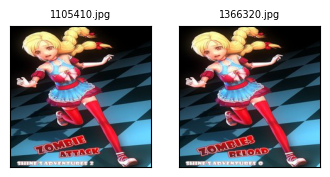

In [29]:
imagelab.report(["near_duplicates"], num_images=num_images)

Issues found in order of severity in the dataset

|    | issue_type   |   num_images |
|---:|:-------------|-------------:|
|  5 | blurry       |           33 | 


Top 12 examples with blurry issue in the dataset.


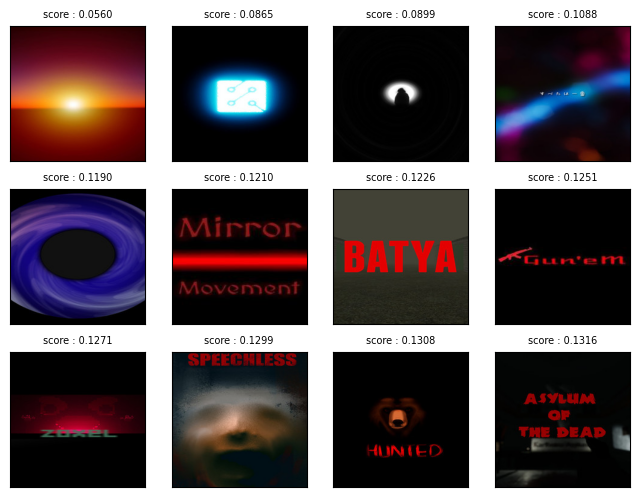

In [30]:
imagelab.report(["blurry"], num_images=num_images)

Issues found in order of severity in the dataset

|    | issue_type   |   num_images |
|---:|:-------------|-------------:|
|  6 | light        |           15 | 


Top 12 examples with light issue in the dataset.


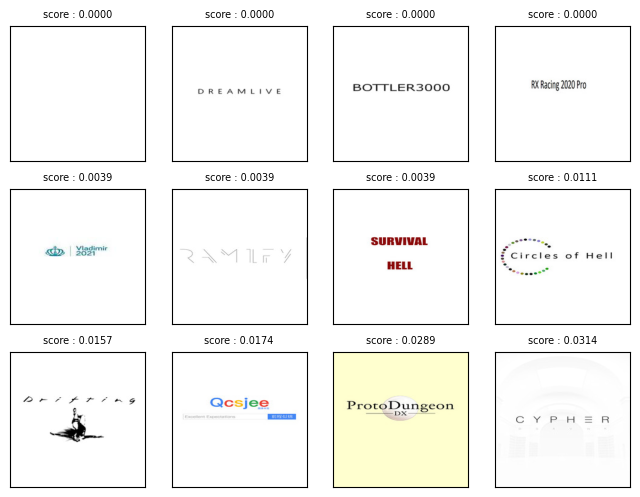

In [31]:
imagelab.report(["light"], num_images=num_images)

In [32]:
imagelab.report(["odd_aspect_ratio"], num_images=num_images)

Issues found in order of severity in the dataset

|    | issue_type       |   num_images |
|---:|:-----------------|-------------:|
|  7 | odd_aspect_ratio |            0 | 

Found 0 example with odd_aspect_ratio issue in the dataset.
